In [1]:
# Require liberies

In [2]:
# Require liberies , download if not available.
!pip install numpy
!pip install panda
!pip install pandasql
!pip install seaborn
!pip install sklearn
!pip install node2vec

In [3]:
#import the libary.

import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
from pandasql import sqldf

import seaborn as sns
import pandas as pd

from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, roc_auc_score
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix

from sklearn.model_selection import train_test_split
from sklearn import model_selection
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.linear_model import ElasticNet
from sklearn.metrics import r2_score
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, precision_score, recall_score
from sklearn.metrics import f1_score, auc, roc_curve, roc_auc_score,confusion_matrix

#Network
import networkx as nx
#from plotly.offline import download_plotlyjs, init_notebook_mode, iplot
#import plotly.graph_objs as go

### Read the dataset

In [4]:
# csv
balance_df  = pd.read_csv("Dataset/balances.csv")
blocks_df  = pd.read_csv("Dataset/blocks.csv")

# json
contracts_df  = pd.read_json("Dataset/contracts.json" , lines=True)
logs_df  = pd.read_json("Dataset/logs.json" , lines=True)
session_df  = pd.read_json("Dataset/session.json" , lines=True)
token_df  = pd.read_json("Dataset/token.json" , lines=True)
token_transfer_df  = pd.read_json("Dataset/token_transfer.json" , lines=True)
transactions_df  = pd.read_json("Dataset/transactions.json" , lines=True)

C:\Users\Asif Raza\anaconda3\envs\MIC\lib\site-packages\IPython\core\interactiveshell.py:3185: DtypeWarning: Columns (1) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


### Exploring the data set tables


In [5]:
balance_df.columns,
#blocks_df.columns ,
#contracts_df.columns,
#logs_df.columns,
#session_df.columns,
#token_df.columns,
#token_transfer_df.columns,         
#transactions_df.columns,
#traces_df.columns,

(Index(['address', 'eth_balance'], dtype='object'),)

In [6]:
#balance_df.schema()

In [7]:
balance_df.head()

,address,eth_balance
0,0xef626cd84b65ce4d5f5e7c3c1d3eb6897d1d4815,4948398769
1,0xeb79d7f5f22e3b1f11b4e500a5cc837040de1d94,1468629015481053
2,0x333a8e9ac3f87d2df0cd1a7d682c020c1b3044e0,1
3,0x753a396c71b419d98619ec29ece96736844c1887,554147000000000
4,0x16677950fcde82ecee7c9742564123e70608cb42,720000000000000


In [8]:
blocks_df.head()

,timestamp,number,hash,parent_hash,nonce,sha3_uncles,logs_bloom,transactions_root,state_root,receipts_root,miner,difficulty,total_difficulty,size,extra_data,gas_limit,gas_used,transaction_count,base_fee_per_gas
0,2018-12-01 13:32:05 UTC,6806679,0x87067ab7ba0857e0d1248d8b5eb2ea5d79abfd34739f...,0x96094ee0328977629520695741766f71277f372c3e40...,0x984b8b6e029ada55,0x1dcc4de8dec75d7aab85b567b6ccd41ad312451b948a...,0x01002010204048083000511200000840001001080000...,0x277a2a9a4e7eb1c67e95d1a1fbb362da34545f0c5e82...,0xdb1a4f80002fab2363601cd57d1eee15f33cb0744262...,0x1be8dfe72e728f9226d9699b014df938cbfcc944f057...,0xcc16e3c00dbbe76603fa833ec20a48f786dfe610,2517000019602951,8090353897381304866703,24492,0x,7992222,7983095,80,NaN
1,2018-12-01 08:01:53 UTC,6805317,0x64a2636e8a31bc9567fb9f86de6c8c7ca2e424d056fa...,0x967763fcd715e63c6c8125873198ec557cbe8c43758d...,0x0a09022301b0d743,0x1dcc4de8dec75d7aab85b567b6ccd41ad312451b948a...,0x00ae8502004000402050141000100022101828013280...,0x6c4af17c340e566b127e09ecf65801f1039f285131b4...,0xe895a4f9fd16925ec8d7996aa581a87abdae91ed9c98...,0x14c4d642b9de31634af889ffc97d725ee68a3fb5ba85...,0xcc16e3c00dbbe76603fa833ec20a48f786dfe610,2550408598239849,8086905974126784897383,19603,0x,7996144,7986523,129,NaN
2,2018-12-01 18:25:47 UTC,6807892,0x36fb17a90333b68a8dcd1b1fafe4cdda86180332a84f...,0x8145c780ecb851c93e0a2d529df00f1f8b8db32c2f9b...,0xdd12386001952c45,0x1dcc4de8dec75d7aab85b567b6ccd41ad312451b948a...,0x000001c0000850282040802200000110000090008030...,0x57956b5d78b5eaf9fc5d7fc45155ce698620ed8dbc16...,0x9860253ca07cc79502fe7cbffecb11dbb12bb2a55714...,0x4974f2d9966df37a58116405d18440061257937463ab...,0xcc16e3c00dbbe76603fa833ec20a48f786dfe610,2468162434441947,8093374968022342964397,9444,0x,7992222,7972370,49,NaN
3,2018-12-01 21:48:27 UTC,6808790,0x031db78f6654082fe4edc10218a1f282384d9816191f...,0x83dcb59d1bcb81c59187c78b967102ae769815ae4036...,0x6130354b017a024f,0x1dcc4de8dec75d7aab85b567b6ccd41ad312451b948a...,0x00c013e00048382928214000a0002844900202008012...,0x940b7ee2f6a7a48adec6caba5581c6ead155761a3299...,0x943c89c3531ef37ac7dd4d22d45128ba3179d09dc3c1...,0xe8d0e642640d7a12306691e76fe660045fb6dbb5d298...,0xcc16e3c00dbbe76603fa833ec20a48f786dfe610,2539147997720865,8095622890310844751937,23286,0x,7992222,7991861,96,NaN
4,2018-12-01 13:42:33 UTC,6806722,0xe979b419430c4ba12812b030740e5495001f564c80c3...,0xd27ef624f3599ba1fdd237bee7751c3e211ddcb88f75...,0xc7b1a2d4001bf198,0x1dcc4de8dec75d7aab85b567b6ccd41ad312451b948a...,0x080430808000800e64214011c8019202641982008020...,0xcb5051b736e21a44078ca82840fb74cdf8d2448c5937...,0xbf40000a6bde5272d08603a491abd24101ac1ab0d413...,0x265cee2eb738ec562eb1ad1817f1eb98a52f82d6e8cd...,0xcc16e3c00dbbe76603fa833ec20a48f786dfe610,2518690667233791,8090461870839567098140,16356,0x,7996144,7964319,107,NaN


In [9]:
contracts_df.head()

,address,bytecode,function_sighashes,is_erc20,is_erc721,block_timestamp,block_number,block_hash
0,0xfa88e5e801812a051749ee5a9d75149ec34b2ecc,0x6080604052348015600f57600080fd5b506004361060...,[],False,False,2022-01-04 07:10:47 UTC,13937561,0xe2da4dcb7fdd11bfc88b552bff6874cd24811961548a...
1,0x593e794cac32b4243e376210677263bc2d7e5063,0x6080604052600436106100825763ffffffff7c010000...,"[0x025313a2, 0x3659cfe6, 0x4555d5c9, 0x4f1ef28...",False,False,2022-01-04 07:11:19 UTC,13937563,0xd81270c9b31cc80973af32107497e8802f410a59aa3e...
2,0xb9623d5d4d675f9b6fadfd871d021ab37218676e,0x60606040526004361061003c5763ffffffff60e06002...,"[0x3ef13367, 0x6b9f96ea, 0xffffffff]",False,False,2022-01-04 07:12:42 UTC,13937567,0x215fcd3fbfcbce194c1d33d9a5206c8dfab9be680849...
3,0xc477a80431b018fac46912b8688c520812e63406,0x608060405234801561001057600080fd5b5060043610...,[],False,False,2022-01-04 07:13:44 UTC,13937572,0x0f3e078329f3334b40e0069c7898d2aa63facb62bd60...
4,0x49f546dec25ed31059cb102e084fd21398f845cb,0x363d3d373d3d3d363d7393d712d952ba4629ca6f5429...,[],False,False,2022-01-04 07:13:45 UTC,13937573,0x2a901148af8a606014aafe767b080335683eebb472f3...


In [10]:
logs_df.head()

,log_index,transaction_hash,transaction_index,address,data,topics,block_timestamp,block_number,block_hash
0,11,0x55ce2387657cd30c3a4e0d5932739668c8ca93f7951c...,0,0xc02aaa39b223fe8d0a0e5c4f27ead9083c756cc2,0x00000000000000000000000000000000000000000000...,[0xddf252ad1be2c89b69c2b068fc378daa952ba7f163c...,2022-01-04 07:33:28 UTC,13937669,0xa43e16c0b0ae14b671e48a15f1b408b970deddd89941...
1,96,0xf189c2808cb82863731156664a53bf75f99272a0a2e9...,14,0x1a4b46696b2bb4794eb3d4c26f1c55f9170fa4c5,0x00000000000000000000000000000000000000000000...,[0xddf252ad1be2c89b69c2b068fc378daa952ba7f163c...,2022-01-04 07:33:28 UTC,13937669,0xa43e16c0b0ae14b671e48a15f1b408b970deddd89941...
2,7,0x55ce2387657cd30c3a4e0d5932739668c8ca93f7951c...,0,0xbc16da9df0a22f01a16bc0620a27e7d6d6488550,0x00000000000000000000000000000000000000000000...,[0xddf252ad1be2c89b69c2b068fc378daa952ba7f163c...,2022-01-04 07:33:28 UTC,13937669,0xa43e16c0b0ae14b671e48a15f1b408b970deddd89941...
3,59,0xfe652603541552e74eb3647b6b7cbd44f64ad3813744...,1,0xe53c884c5a297713197217509ffb654c9677b347,0x00000000000000000000000000000000000000000000...,[0xd78ad95fa46c994b6551d0da85fc275fe613ce37657...,2022-01-04 07:33:28 UTC,13937669,0xa43e16c0b0ae14b671e48a15f1b408b970deddd89941...
4,25,0x55ce2387657cd30c3a4e0d5932739668c8ca93f7951c...,0,0x9008d19f58aabd9ed0d60971565aa8510560ab41,0x,[0x40338ce1a7c49204f0099533b1e9a7ee0a3d261f849...,2022-01-04 07:33:28 UTC,13937669,0xa43e16c0b0ae14b671e48a15f1b408b970deddd89941...


In [11]:
session_df.head()

,id,start_trace_id,start_block_number,start_block_timestamp,wallet_address,contract_address
0,2c58ad3d51191206cae76603e6515486,call_0x813976bb6d34736f4b49ca1b8b62095a45e275a...,1146945,2016-03-14 04:37:20 UTC,0x1f93b5e75a04b225816935c3d65f552cac88a61b,0x9af09991ad63814e53ffc1bccf213ee74027608b
1,015077194fbb69433e86bff00dfb9f8a,call_0x08b7017d30675a4dbe4a0ef92aee6cc61305e06...,1148835,2016-03-14 13:26:24 UTC,0xae16540a2db328b03c17c8c63db269d16cfe0099,0x32be343b94f860124dc4fee278fdcbd38c102d88
2,a774710f86744db59a349f1648a0c019,call_0xf9b1797dd430c38500f17064ce35821241cd95e...,1148835,2016-03-14 13:26:24 UTC,0xc16482d0ec45c4f3b9d84286faccd8373cebcadb,0x32be343b94f860124dc4fee278fdcbd38c102d88
3,bfdb2fe57c361874dc958805a11f955a,call_0x0a8da35c639c794d9c87d375dda9db9431fead4...,1148835,2016-03-14 13:26:24 UTC,0x47c5f38547dcd45db87e562487205677e0e40e6d,0x32be343b94f860124dc4fee278fdcbd38c102d88
4,838d09b484c9f7df57ff5c741f27ee0d,call_0x0599ba48c5f4f37e920e851f3ced28e35e6fbae...,1148835,2016-03-14 13:26:24 UTC,0x77da935affa2f19936359d15caf75512b46e7752,0x32be343b94f860124dc4fee278fdcbd38c102d88


In [12]:
token_df.head()

,address,symbol,name,decimals,total_supply,block_timestamp,block_number,block_hash
0,0x5d1be48bfd57f38975a01776611a5f669eee0a6e,RBC,Rose Bros Coin,9.0,1.000000e+21,2022-01-03 00:20:39 UTC,13929265,0xc7ca8989624c94ced95143ceaa70aea02896c88e8c69...
1,0x2a7e040c80bee42937c2a59fd159c9b1786bce0d,TT,TinqueToken,NaN,0.000000e+00,2021-10-28 02:27:36 UTC,13503045,0x7dcadd1ad7ded04735348aa64f0033dad918d98d0d99...
2,0x6023da5c4ed130e73cd816ec931b562db2c346bb,GD,GameDisease,NaN,4.327000e+03,2021-10-28 11:14:21 UTC,13505398,0x7b674abf0a8b4a796f0d27e8fd6d915508a75544b4c6...
3,0xca964db9e4f09ddf0162b0023159f7828dea7278,ACW,ACW Token,8.0,1.000000e+16,2021-10-28 18:27:36 UTC,13507337,0xb7828621f08e8cd1dac9c169b228abfc3f5441c5021a...
4,0x1102a701aa6e1b065e95dbd4718baf82132fbd03,RMT,RomanToken,8.0,1.000000e+18,2021-10-28 06:05:22 UTC,13504020,0x3c24f3a66c564071ad6780819c2acd76450d08cf9a78...


In [13]:
token_transfer_df.head()

,token_address,from_address,to_address,value,transaction_hash,log_index,block_timestamp,block_number,block_hash
0,0x98b486f4fd2a1526eb6fd09f200735d4a9fcadfa,0x375c2b612795a462ebcbf6ffc4735e9d9b59e95d,0xb59beadb72ac1b1d3e44ff65326ec8d49d742cb8,1.039000e+03,0x75572e39b83ad6980f615af8e0d54d0d92203f91f5f5...,4,2022-01-04 08:39:03 UTC,13937962,0x0a6c42183e05f6425368b4eac10d6fb2055237d04548...
1,0x26607ac599266b21d13c7acf7942c7701a8b699c,0x190235008a27dd13ec6ae595f74c93d0b87add28,0x0092decca5e2f26466289011ad41465763bea4ce,5.850000e+18,0xa40ebaa98fcb9cdb46ce7385aed8e481f42a16826cf2...,35,2022-01-04 08:39:06 UTC,13937963,0x2636bbaab96a238833ee8d2500ef91f8f5b085c5830e...
2,0x612c393dace91284dafc23e623aab084fa0ffa64,0xa54a75da2dbfc491a87560a0675672ce30b52de7,0x612c393dace91284dafc23e623aab084fa0ffa64,5.600000e+21,0x8ae7ae9720e11e5d20c3f2bbbcb9d5c0a20e50ef960c...,64,2022-01-04 08:39:06 UTC,13937963,0x2636bbaab96a238833ee8d2500ef91f8f5b085c5830e...
3,0x09a3ecafa817268f77be1283176b946c4ff2e608,0x2c691e3c7c05ebd156e40684ee299f2de62a9fd7,0x9fb7e5f71517c9b0059e3200b51bbd1477db333b,1.554691e+22,0x7988ed65750c5e93c9b0459e979c1d53f1bbe066c27c...,1,2022-01-04 08:39:06 UTC,13937963,0x2636bbaab96a238833ee8d2500ef91f8f5b085c5830e...
4,0xa74476443119a942de498590fe1f2454d7d4ac0d,0xf2db30101b2168deafcb0343f2ecd37ff56e8602,0x63e47f259f47f6e2c46e2546a7e4defc6b1642e1,4.950337e+21,0xa02082fa55add26fc7cc4ca1738894f23939cb24ab7b...,25,2022-01-04 08:39:07 UTC,13937964,0xeb3d9986fd05001512ba48ecb75c43f85e05a27ef8e5...


In [14]:
transactions_df.head()

,hash,nonce,transaction_index,from_address,to_address,value,gas,gas_price,input,receipt_cumulative_gas_used,...,receipt_status,block_timestamp,block_number,block_hash,max_fee_per_gas,max_priority_fee_per_gas,transaction_type,receipt_effective_gas_price,receipt_contract_address,receipt_root
0,0x62200c3185b5e7be2d7d426a401977bc7180ec2e6bc1...,15,42,0xe48c1d60e84267e420d0b5049a5c54fe3a3d0102,0xeed560b1b0172baa6e137c27aa0a643326f360d1,7.000000e+16,95825,69510141807,0xa0712d68000000000000000000000000000000000000...,2100195,...,1.0,2022-01-04 09:07:38 UTC,13938097,0x948619b88a03f230a0c22c86e9e9d7302e1b05bd7571...,9.011094e+10,1.500000e+09,2.0,69510141807,NaN,NaN
1,0xf4adc8201dd0f3a40623082d5f1ce0fd2a8e69ac64a0...,56,22,0xe09e54fc717735892382b1e873f34df61973d796,0xa0b86991c6218b36c1d19d4a2e9eb0ce3606eb48,0.000000e+00,250000,70010141807,0xa9059cbb000000000000000000000000503828976d22...,1130966,...,1.0,2022-01-04 09:07:38 UTC,13938097,0x948619b88a03f230a0c22c86e9e9d7302e1b05bd7571...,1.280000e+11,2.000000e+09,2.0,70010141807,NaN,NaN
2,0x1270116d729bf738b1b910d39448a25e62b95e8d7a4d...,70,41,0x00079e801ad138215b1c901c7b296484c3e863f1,0x15d4c048f83bd7e37d49ea4c83a07267ec4203da,0.000000e+00,46609,70010141807,0x095ea7b3000000000000000000000000881d40237659...,2004370,...,1.0,2022-01-04 09:07:38 UTC,13938097,0x948619b88a03f230a0c22c86e9e9d7302e1b05bd7571...,9.415538e+10,2.000000e+09,2.0,70010141807,NaN,NaN
3,0xace12cda5a4c1c867ac9265e33781d85b87bf6e0f01d...,374,1,0xd8fcc31b335e60170b680026323d07bb435faf06,0xde30da39c46104798bb5aa3fe8b9e0e1f348163f,0.000000e+00,200000,106831249038,0xa9059cbb0000000000000000000000009cc5be83b211...,90007,...,1.0,2022-01-04 09:07:38 UTC,13938097,0x948619b88a03f230a0c22c86e9e9d7302e1b05bd7571...,NaN,NaN,NaN,106831249038,NaN,NaN
4,0xe1412bc9be2a17302494d2d27792c24c28fe06554dca...,4,70,0x78263543ba3f3b2a75d02cd239f671dae9dc47f1,0x6a5d1449263c0ddde0a30bf48714ff97503597dc,0.000000e+00,588237,68510141807,0x77d6c6e500000000000000000000000078263543ba3f...,8388660,...,1.0,2022-01-04 09:07:38 UTC,13938097,0x948619b88a03f230a0c22c86e9e9d7302e1b05bd7571...,7.577538e+10,5.000000e+08,2.0,68510141807,NaN,NaN


## Querying and Analayis

### Block related query :

In [15]:
blocks_df.head()

,timestamp,number,hash,parent_hash,nonce,sha3_uncles,logs_bloom,transactions_root,state_root,receipts_root,miner,difficulty,total_difficulty,size,extra_data,gas_limit,gas_used,transaction_count,base_fee_per_gas
0,2018-12-01 13:32:05 UTC,6806679,0x87067ab7ba0857e0d1248d8b5eb2ea5d79abfd34739f...,0x96094ee0328977629520695741766f71277f372c3e40...,0x984b8b6e029ada55,0x1dcc4de8dec75d7aab85b567b6ccd41ad312451b948a...,0x01002010204048083000511200000840001001080000...,0x277a2a9a4e7eb1c67e95d1a1fbb362da34545f0c5e82...,0xdb1a4f80002fab2363601cd57d1eee15f33cb0744262...,0x1be8dfe72e728f9226d9699b014df938cbfcc944f057...,0xcc16e3c00dbbe76603fa833ec20a48f786dfe610,2517000019602951,8090353897381304866703,24492,0x,7992222,7983095,80,NaN
1,2018-12-01 08:01:53 UTC,6805317,0x64a2636e8a31bc9567fb9f86de6c8c7ca2e424d056fa...,0x967763fcd715e63c6c8125873198ec557cbe8c43758d...,0x0a09022301b0d743,0x1dcc4de8dec75d7aab85b567b6ccd41ad312451b948a...,0x00ae8502004000402050141000100022101828013280...,0x6c4af17c340e566b127e09ecf65801f1039f285131b4...,0xe895a4f9fd16925ec8d7996aa581a87abdae91ed9c98...,0x14c4d642b9de31634af889ffc97d725ee68a3fb5ba85...,0xcc16e3c00dbbe76603fa833ec20a48f786dfe610,2550408598239849,8086905974126784897383,19603,0x,7996144,7986523,129,NaN
2,2018-12-01 18:25:47 UTC,6807892,0x36fb17a90333b68a8dcd1b1fafe4cdda86180332a84f...,0x8145c780ecb851c93e0a2d529df00f1f8b8db32c2f9b...,0xdd12386001952c45,0x1dcc4de8dec75d7aab85b567b6ccd41ad312451b948a...,0x000001c0000850282040802200000110000090008030...,0x57956b5d78b5eaf9fc5d7fc45155ce698620ed8dbc16...,0x9860253ca07cc79502fe7cbffecb11dbb12bb2a55714...,0x4974f2d9966df37a58116405d18440061257937463ab...,0xcc16e3c00dbbe76603fa833ec20a48f786dfe610,2468162434441947,8093374968022342964397,9444,0x,7992222,7972370,49,NaN
3,2018-12-01 21:48:27 UTC,6808790,0x031db78f6654082fe4edc10218a1f282384d9816191f...,0x83dcb59d1bcb81c59187c78b967102ae769815ae4036...,0x6130354b017a024f,0x1dcc4de8dec75d7aab85b567b6ccd41ad312451b948a...,0x00c013e00048382928214000a0002844900202008012...,0x940b7ee2f6a7a48adec6caba5581c6ead155761a3299...,0x943c89c3531ef37ac7dd4d22d45128ba3179d09dc3c1...,0xe8d0e642640d7a12306691e76fe660045fb6dbb5d298...,0xcc16e3c00dbbe76603fa833ec20a48f786dfe610,2539147997720865,8095622890310844751937,23286,0x,7992222,7991861,96,NaN
4,2018-12-01 13:42:33 UTC,6806722,0xe979b419430c4ba12812b030740e5495001f564c80c3...,0xd27ef624f3599ba1fdd237bee7751c3e211ddcb88f75...,0xc7b1a2d4001bf198,0x1dcc4de8dec75d7aab85b567b6ccd41ad312451b948a...,0x080430808000800e64214011c8019202641982008020...,0xcb5051b736e21a44078ca82840fb74cdf8d2448c5937...,0xbf40000a6bde5272d08603a491abd24101ac1ab0d413...,0x265cee2eb738ec562eb1ad1817f1eb98a52f82d6e8cd...,0xcc16e3c00dbbe76603fa833ec20a48f786dfe610,2518690667233791,8090461870839567098140,16356,0x,7996144,7964319,107,NaN


##### Numer of block creation per month & year

In [16]:
query = sqldf(" SELECT timestamp , count(*) as count FROM blocks_df GROUP BY 1 ")
query

,timestamp,count
0,2016-12-02 00:00:10 UTC,1
1,2016-12-02 00:00:21 UTC,1
2,2016-12-02 00:00:35 UTC,1
3,2016-12-02 00:00:39 UTC,1
4,2016-12-02 00:01:05 UTC,1
...,...,...
99995,2021-09-19 23:58:08 UTC,1
99996,2021-09-19 23:58:30 UTC,1
99997,2021-09-19 23:59:02 UTC,1
99998,2021-09-19 23:59:05 UTC,1


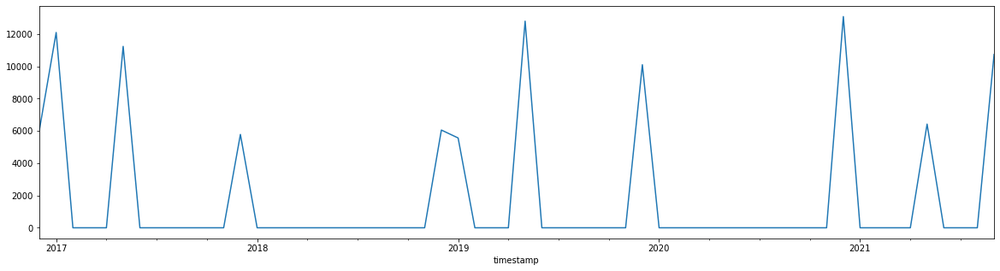

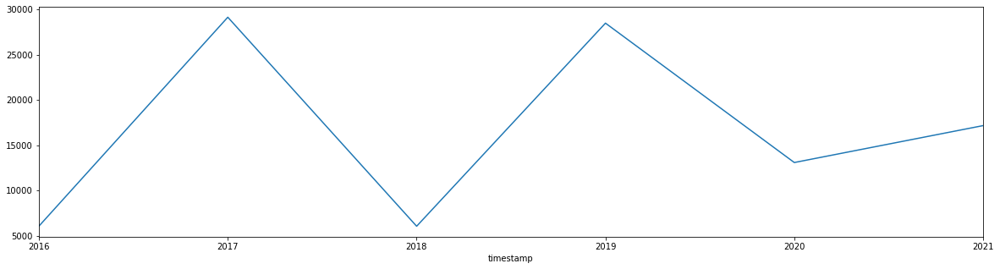

In [17]:
#per month
query['timestamp'] = pd.to_datetime(query.timestamp)
agg = query.resample('M', on='timestamp').sum()
agg.plot(y='count', legend=False, figsize=(20, 5))
title='Ethereum Smart Contracts (monthly totals)',
plt.savefig('transactions_over_time.png', transparent=True)

#Per year
agg = query.resample('Y', on='timestamp').sum()
agg.plot(y='count', legend=False, figsize=(20, 5))
title='Ethereum Smart Contracts (monthly totals)',
plt.savefig('transactions_over_time.png', transparent=True)


##### Gas used per block creation per month & year

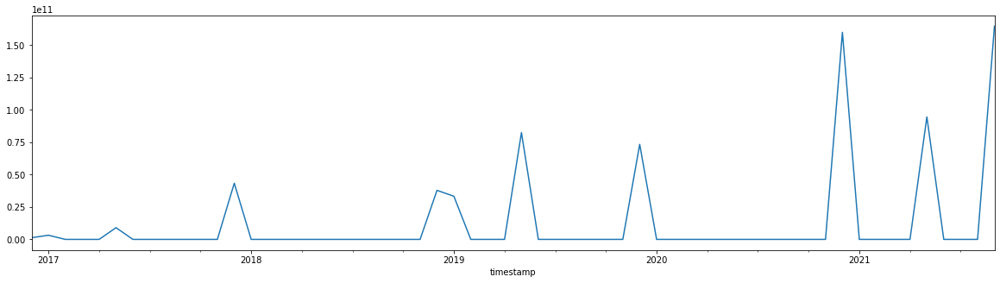

In [18]:

query =  """SELECT timestamp , sum(gas_used) as gas_used FROM blocks_df GROUP BY 1  """
query = sqldf(query)
#query

query['timestamp'] = pd.to_datetime(query.timestamp)
agg = query.resample('M', on='timestamp').sum()
agg.plot(y='gas_used', legend=False, figsize=(20, 5))
title='Ethereum Smart Contracts (monthly totals)',
plt.savefig('transactions_over_time.png', transparent=True)

#f, g = plt.subplots(figsize=(12, 9))
#g = sns.lineplot(x="agg", y="gas_used", data=df, palette="Blues_d")
#plt.title("Gas used per block over time")
#plt.show(g)

##### Block size  per block creation over the time ( month & year)

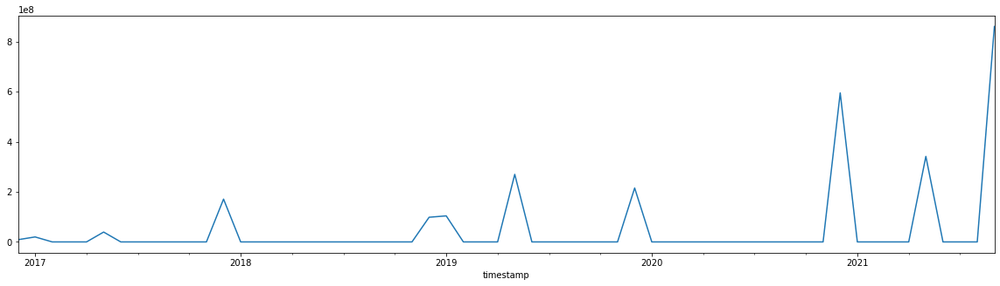

In [19]:

query =  """SELECT timestamp , sum(size) as block_size FROM blocks_df GROUP BY 1  """
query = sqldf(query)
#query

query['timestamp'] = pd.to_datetime(query.timestamp)
agg = query.resample('M', on='timestamp').sum()
agg.plot(y='block_size', legend=False, figsize=(20, 5))
#title='Ethereum Smart Contracts (monthly totals)',
plt.savefig('transactions_over_time.png', transparent=True)

#f, g = plt.subplots(figsize=(12, 9))
#g = sns.lineplot(x="agg", y="gas_used", data=df, palette="Blues_d")
#plt.title("Gas used per block over time")
#plt.show(g)

##### Top 5 Minner's, which generated number of blocks

In [20]:
# which miner create most of block's
query =  """ Select * from (SELECT miner , count(1) as minner_count FROM blocks_df GROUP BY 1 ) order by minner_count desc  """
output = sqldf(query).head()
output

,miner,minner_count
0,0xea674fdde714fd979de3edf0f56aa9716b898ec8,21949
1,0x5a0b54d5dc17e0aadc383d2db43b0a0d3e029c4c,15331
2,0x829bd824b016326a401d083b33d092293333a830,8295
3,0x52bc44d5378309ee2abf1539bf71de1b7d7be3b5,7450
4,0x61c808d82a3ac53231750dadc13c777b59310bd9,6723


### Balance related query

#### Top 5 address balance holder account

In [21]:
output = sqldf(" Select * from (SELECT address, sum(eth_balance) as current_balance from balance_df group by address) order by 2 desc ")
output.head()

,address,current_balance
0,0x30a2ebf10f34c6c4874b0bdd5740690fd2f3b70c,8.855710e+22
1,0x49be8a0773824e2917f4baccebbdf298e7cf27bd,4.291818e+22
2,0x517c46825fb35c273de66d71dcef0d7b63b1076b,3.647571e+22
3,0x28800b3df0ff4eb76809b17b75f43060b7256279,3.072638e+22
4,0x867b3b0b638cd5640ec800dcbc407bad64ef1ae7,2.170947e+22


### Transactions related query 

In [22]:
transactions_df.head()

,hash,nonce,transaction_index,from_address,to_address,value,gas,gas_price,input,receipt_cumulative_gas_used,...,receipt_status,block_timestamp,block_number,block_hash,max_fee_per_gas,max_priority_fee_per_gas,transaction_type,receipt_effective_gas_price,receipt_contract_address,receipt_root
0,0x62200c3185b5e7be2d7d426a401977bc7180ec2e6bc1...,15,42,0xe48c1d60e84267e420d0b5049a5c54fe3a3d0102,0xeed560b1b0172baa6e137c27aa0a643326f360d1,7.000000e+16,95825,69510141807,0xa0712d68000000000000000000000000000000000000...,2100195,...,1.0,2022-01-04 09:07:38 UTC,13938097,0x948619b88a03f230a0c22c86e9e9d7302e1b05bd7571...,9.011094e+10,1.500000e+09,2.0,69510141807,NaN,NaN
1,0xf4adc8201dd0f3a40623082d5f1ce0fd2a8e69ac64a0...,56,22,0xe09e54fc717735892382b1e873f34df61973d796,0xa0b86991c6218b36c1d19d4a2e9eb0ce3606eb48,0.000000e+00,250000,70010141807,0xa9059cbb000000000000000000000000503828976d22...,1130966,...,1.0,2022-01-04 09:07:38 UTC,13938097,0x948619b88a03f230a0c22c86e9e9d7302e1b05bd7571...,1.280000e+11,2.000000e+09,2.0,70010141807,NaN,NaN
2,0x1270116d729bf738b1b910d39448a25e62b95e8d7a4d...,70,41,0x00079e801ad138215b1c901c7b296484c3e863f1,0x15d4c048f83bd7e37d49ea4c83a07267ec4203da,0.000000e+00,46609,70010141807,0x095ea7b3000000000000000000000000881d40237659...,2004370,...,1.0,2022-01-04 09:07:38 UTC,13938097,0x948619b88a03f230a0c22c86e9e9d7302e1b05bd7571...,9.415538e+10,2.000000e+09,2.0,70010141807,NaN,NaN
3,0xace12cda5a4c1c867ac9265e33781d85b87bf6e0f01d...,374,1,0xd8fcc31b335e60170b680026323d07bb435faf06,0xde30da39c46104798bb5aa3fe8b9e0e1f348163f,0.000000e+00,200000,106831249038,0xa9059cbb0000000000000000000000009cc5be83b211...,90007,...,1.0,2022-01-04 09:07:38 UTC,13938097,0x948619b88a03f230a0c22c86e9e9d7302e1b05bd7571...,NaN,NaN,NaN,106831249038,NaN,NaN
4,0xe1412bc9be2a17302494d2d27792c24c28fe06554dca...,4,70,0x78263543ba3f3b2a75d02cd239f671dae9dc47f1,0x6a5d1449263c0ddde0a30bf48714ff97503597dc,0.000000e+00,588237,68510141807,0x77d6c6e500000000000000000000000078263543ba3f...,8388660,...,1.0,2022-01-04 09:07:38 UTC,13938097,0x948619b88a03f230a0c22c86e9e9d7302e1b05bd7571...,7.577538e+10,5.000000e+08,2.0,68510141807,NaN,NaN


####  Top 5 address's received number of transactions

In [23]:
output = sqldf("Select * from (SELECT to_address, count(*) as count FROM transactions_df GROUP BY 1 ) order by 2 desc")
output.head() 

,to_address,count
0,0x32be343b94f860124dc4fee278fdcbd38c102d88,17168
1,0xdac17f958d2ee523a2206206994597c13d831ec7,2395
2,0x7c5080988c6d91d090c23d54740f856c69450b29,2337
3,0xc47aaa860008be6f65b58c6c6e02a84e666efe31,2331
4,0x7be8076f4ea4a4ad08075c2508e481d6c946d12b,2208


In [24]:
#checking
output = sqldf("SELECT * FROM transactions_df where to_address = '0x32be343b94f860124dc4fee278fdcbd38c102d88' ")
output

,hash,nonce,transaction_index,from_address,to_address,value,gas,gas_price,input,receipt_cumulative_gas_used,...,receipt_status,block_timestamp,block_number,block_hash,max_fee_per_gas,max_priority_fee_per_gas,transaction_type,receipt_effective_gas_price,receipt_contract_address,receipt_root
0,0x94038e1e1685baff84ec0dae69e6010ab4246b92ecc3...,11,0,0xc3fe64d1af00f0d9c324e4387ef7533f7d788e95,0x32be343b94f860124dc4fee278fdcbd38c102d88,3.109876e+19,21000,59523469568,0x,21000,...,None,2015-08-15 17:33:42 UTC,91700,0x907440a455dd1333be5b35bf85ea3d5bb131df0c05e7...,None,None,None,59523469568,None,0xe4260e110be7ae445e4822367e87320c9c68b3bbcd10...
1,0xd0acd421e64e12ef717fffe2d0f0b82c32c94b05405b...,0,0,0xf9c510f7834fdbb937d6d088e42650600c73039a,0x32be343b94f860124dc4fee278fdcbd38c102d88,1.508873e+19,21000,59855067648,0x,21000,...,None,2015-08-15 02:31:41 UTC,88295,0x5647a1400b0ab10b54ea100ea56ca4d28f27765b2780...,None,None,None,59855067648,None,0x5a6ddf36109ced6e0d56f0c0daf8142450221dab749a...
2,0xfa91249eaf0071fd29cf7e34a3911629a0d674880c6d...,6,0,0x30bed8049947963394d93412326225e4e3123601,0x32be343b94f860124dc4fee278fdcbd38c102d88,2.549882e+19,21000,56243843840,0x,21000,...,None,2015-08-15 09:33:23 UTC,89920,0x7a95b85d27a46ae3ef022dc826aebcb747d9cb4ceb6b...,None,None,None,56243843840,None,0x7fe7db198b96e63caaca8e576e8bef96906bc66206f6...
3,0x63d8879bc3ee9e6e43f5d99d6c8a2d27de9785517e8a...,118,0,0xa70a9a7040d542c632d8e0be7c5513a8a5bbc752,0x32be343b94f860124dc4fee278fdcbd38c102d88,4.998734e+18,21000,59643351297,0x,21000,...,None,2015-08-15 15:20:36 UTC,91208,0xc80c5a8888d4cd5568162560fb98d8227be2eeb7b8f0...,None,None,None,59643351297,None,0xb260446886eb4e2731c817481efeacc8ad52b921c8c8...
4,0x96f1cee57988409c38d967ebd9930a65ab25846ee531...,98,0,0xa6bdc31c431b8f97848c9d60cbbe9660dc450eb7,0x32be343b94f860124dc4fee278fdcbd38c102d88,4.998774e+18,21000,58370384897,0x,21000,...,None,2015-08-15 20:16:30 UTC,92290,0xe1bd6bb819ad0b0720b3c84d552e8d56823d1bb77c0a...,None,None,None,58370384897,None,0x109b77ffe3fcf5e4071dd04b645f5de3ab8e0e55edee...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17163,0x5562a5e2c893f22802e132906404690c009460b3c7be...,133,4,0x0ebf34ef7f813ad4ff2f846db5167d338476b53f,0x32be343b94f860124dc4fee278fdcbd38c102d88,1.008478e+19,21000,50000000000,0x,105000,...,None,2015-09-29 02:02:23 UTC,305575,0x23ef225cacf1128e27d08c40d4291915f519d36979b7...,None,None,None,50000000000,None,0xc51c2091e492318405834a6def8dd2175cf7311a8408...
17164,0x8d2651f88756d7b34320f971366b2060ec4243cd6512...,4158,3,0x7c5080988c6d91d090c23d54740f856c69450b29,0x32be343b94f860124dc4fee278fdcbd38c102d88,9.576229e+16,21000,50000000000,0x,84000,...,None,2015-09-29 02:02:23 UTC,305575,0x23ef225cacf1128e27d08c40d4291915f519d36979b7...,None,None,None,50000000000,None,0xd0af2d5f9499c3c19cd25542081d45f75ae379fc40c7...
17165,0xe1f1026ec2f7c93b0b9c95734fbe0df1cb5264ae6a42...,620,0,0xa6bdc31c431b8f97848c9d60cbbe9660dc450eb7,0x32be343b94f860124dc4fee278fdcbd38c102d88,5.001050e+18,21000,50000000000,0x,21000,...,None,2015-09-29 10:07:51 UTC,307125,0xd0a54c8e8389ff7343343841f48ea185541496c853e2...,None,None,None,50000000000,None,0x0a2b3375b6262b7ca23cfbe09c912c4f628015f003f8...
17166,0xc05bf6ad4efa3106f63894ad6484b7c2807a20326888...,92,2,0x267069452478ca39b3f5f1a4ffdd4131f50bc977,0x32be343b94f860124dc4fee278fdcbd38c102d88,2.600019e+18,21000,50000000000,0x,63000,...,None,2015-09-29 10:07:51 UTC,307125,0xd0a54c8e8389ff7343343841f48ea185541496c853e2...,None,None,None,50000000000,None,0xbd86e1ab69cc3a9b8d17400aff282db9c92e40563db9...


#### Top 5 address's performed number of transactions

In [25]:
output = sqldf("Select * from (SELECT from_address, count(*) as count FROM transactions_df GROUP BY 1 ) order by 2 desc")
output.head()

,from_address,count
0,0x52bc44d5378309ee2abf1539bf71de1b7d7be3b5,7415
1,0x1dcb8d1f0fcc8cbc8c2d76528e877f915e299fbe,6931
2,0xe6a7a1d47ff21b6321162aea7c6cb457d5476bca,4539
3,0x2a65aca4d5fc5b5c859090a6c34d164135398226,1600
4,0x32be343b94f860124dc4fee278fdcbd38c102d88,1594


In [26]:
#checking
output = sqldf("SELECT * FROM transactions_df where to_address = '0x52bc44d5378309ee2abf1539bf71de1b7d7be3b5' ")
output

,hash,nonce,transaction_index,from_address,to_address,value,gas,gas_price,input,receipt_cumulative_gas_used,...,receipt_status,block_timestamp,block_number,block_hash,max_fee_per_gas,max_priority_fee_per_gas,transaction_type,receipt_effective_gas_price,receipt_contract_address,receipt_root
0,0x2a40b6bebcec70e012b4f149273817a047fc97b7b98a...,36896,63,0x52bc44d5378309ee2abf1539bf71de1b7d7be3b5,0x52bc44d5378309ee2abf1539bf71de1b7d7be3b5,1.762873e+17,25000,50000000000,0x,1344000,...,None,2015-09-23 09:10:40 UTC,277379,0xe48c9a8825690cdb08a7d0b085c9a886842cd2edd2d7...,None,None,None,50000000000,None,0xc5086d779e14e81370dab66c67a8c931a93bdd422d38...
1,0x6111e64087a2985dc06f937d4b3bac1ff8e50eed05b7...,227,3,0x52bc44d5378309ee2abf1539bf71de1b7d7be3b5,0x52bc44d5378309ee2abf1539bf71de1b7d7be3b5,6.696229e+17,25000,1178436674919,0x,84000,...,None,2015-08-19 22:13:59 UTC,113378,0x9d460a728e661db9754ede4644b26b5d0217683e360c...,None,None,None,1178436674919,None,0x5652b634950ea4bddf76a4d2a9a64bfc55fe082012ac...


#### Ethereum top 10 highest transaction fees

In [27]:
query = """
        SELECT hash, value, gas_price as gas_price_in_wei, receipt_gas_used, receipt_cumulative_gas_used, 
        gas_price / 1000000000000000000 * receipt_gas_used as fee_in_ether, `block_timestamp` FROM transactions_df 
        ORDER BY `receipt_gas_used` DESC LIMIT 10 """

output = sqldf(query)
output

,hash,value,gas_price_in_wei,receipt_gas_used,receipt_cumulative_gas_used,fee_in_ether,block_timestamp
0,0x180121aadbf84240f6c2203067c0c2364bde96d5a54c...,2.456515e+16,91604901778,13214788,14475427,0,2022-01-04 08:37:49 UTC
1,0x62d22c572da9658c75520fc13a355777d5f6affb3cbf...,0.000000e+00,59950082302,13011074,14637195,0,2022-01-04 09:13:14 UTC
2,0x4a001040fdaf9b99e74e74827739fcbb2367cfbabfea...,0.000000e+00,88040947441,10141432,18440574,0,2022-01-04 08:36:26 UTC
3,0xeb0a23e468b50a7aa013dd5e48b39ae2bee474a79e00...,0.000000e+00,81649398920,8116621,22645171,0,2022-01-04 08:37:20 UTC
4,0xa082d77a6ffa021fcc24194e94c876e8778852c6db5d...,0.000000e+00,97207159413,5743727,11910796,0,2022-01-04 08:30:00 UTC
5,0x04c00ed19e461c4cf600c2cad085e7a4ecc4419320a0...,5.896500e+18,81649398920,5659706,14231171,0,2022-01-04 08:37:20 UTC
6,0xa17b5172b94c187411ce48fd97921bf52acb8a6010c1...,0.000000e+00,67154781019,5511805,21884928,0,2022-01-04 09:04:46 UTC
7,0x834f430166ecb6612e275f37d25d747d66be5c6ae0a9...,2.940270e+19,88527120102,5430610,12295448,0,2022-01-04 08:59:17 UTC
8,0xd1ee842db07a18838147e75a9b841bcd736a1d3e02cf...,6.987512e+16,82198695211,5185737,25439425,0,2022-01-04 08:35:08 UTC
9,0xeba2f38a3cbc7bdce5b79cb0555810e7a54f9d8ba3eb...,0.000000e+00,72290284771,4667030,5579187,0,2022-01-04 09:13:06 UTC


#### Top 10 extreme case for transfer

In [28]:
query = """
        SELECT hash, value, gas_price as gas_price_in_wei, receipt_gas_used, receipt_cumulative_gas_used, gas_price / 1000000000000000000 * receipt_gas_used as fee_in_ether, block_timestamp
        FROM transactions_df
        ORDER BY `gas_price` DESC
        LIMIT 10
        """
output = sqldf(query)
output

,hash,value,gas_price_in_wei,receipt_gas_used,receipt_cumulative_gas_used,fee_in_ether,block_timestamp
0,0x4e2fe7e4df72f0c446e0bcb860558d40de43ce50a104...,4.980000e+19,100000000000000,21000,21000,0,2015-08-10 03:21:21 UTC
1,0xae70f124d70805e30fa30ac8fca63738b65e7c560774...,4.980000e+19,100000000000000,21000,42000,0,2015-08-10 03:21:21 UTC
2,0x098f44bd5c99e94029f00d2bd30f6c2934e486c8ea2a...,0.000000e+00,30000000000000,21000,21000,0,2015-08-14 14:07:41 UTC
3,0xa2b02788dca0370ddfc008d83d85809681d932933eed...,0.000000e+00,10480225986432,89416,376144,0,2022-01-04 08:55:49 UTC
4,0x35f2eedc810c065bdde2d2e629e8d1d1535158f825c1...,0.000000e+00,10000000000000,24584,24584,0,2015-08-15 17:01:37 UTC
5,0x630e61d6660797af5ef269de503df70a72e535a48767...,0.000000e+00,10000000000000,22152,22152,0,2015-08-15 21:23:05 UTC
6,0xdbdf224d0eca0f06e0fb2df15346ceccd2e5116d6edc...,6.370000e+20,10000000000000,21612,21612,0,2015-08-15 05:09:58 UTC
7,0xda35ca859856623991e0783852aa9c22a5549ebc277d...,5.000000e+18,10000000000000,21612,21612,0,2015-08-15 04:46:40 UTC
8,0x7bf4275ea60d3bf28970427135e634d1d615a3007758...,1.000000e+21,10000000000000,21612,21612,0,2015-08-15 05:13:06 UTC
9,0x794f05af40d59e0e78d2a5831bb6f377b97b370ca749...,8.000000e+18,10000000000000,21612,21612,0,2015-08-15 05:03:58 UTC


####  Top 5 greatest amount (value) of transactions

In [29]:
output = sqldf("Select * FROM transactions_df order by value desc limit 5")
output.head()

,hash,nonce,transaction_index,from_address,to_address,value,gas,gas_price,input,receipt_cumulative_gas_used,...,receipt_status,block_timestamp,block_number,block_hash,max_fee_per_gas,max_priority_fee_per_gas,transaction_type,receipt_effective_gas_price,receipt_contract_address,receipt_root
0,0x06009c3ec85e51fc1c0d29adb688219708b0fa782f3b...,0,0,0xb2d7e6cd1b25f591e2e630ba65dac638e6cd4c8e,0x65d7e41bc79587db2febbcea0ad9d76469c88085,3.232034e+23,21000,100000000000,0x,21000,...,None,2015-08-15 20:30:55 UTC,92346,0xe98b6e700311f79b3a201beb6cbfdefe999d17cf8877...,None,None,None,100000000000,None,0x50c62bb0eb9cd0a90e771dce7e7bf5986e1455e180d5...
1,0x64371af762a31b44b060f896cccffbc088a3d73eb18d...,0,0,0x1a56a50c378d21d0aa544ed9a482300c7f6e78ec,0x119058dc2c577e9c4ba6914678aa9db565300ffe,3.232034e+23,21000,100000000000,0x,21000,...,None,2015-08-17 16:11:03 UTC,101773,0xe802363e95a7e4700058c64f308ff726eba63ec7a400...,None,None,None,100000000000,None,0x8bc88cdfd56d90c4be659534c19217d7d1b9579ba55b...
2,0x5e02f5c83298e0457dccb909e6e6d488601e7c1a7e73...,1,1,0xb2d7e6cd1b25f591e2e630ba65dac638e6cd4c8e,0xddfafdbc7c90f1320e54b98f374617fbd01d109f,2.962748e+23,21000,100000000000,0x,42000,...,None,2015-08-15 20:30:55 UTC,92346,0xe98b6e700311f79b3a201beb6cbfdefe999d17cf8877...,None,None,None,100000000000,None,0x07640837f9afee52d82adf4b55ae2b87662366d1bbd0...
3,0xf3f1210dfc29108e52d5bfc81fb1714d6f676f64ac58...,952,0,0x32be343b94f860124dc4fee278fdcbd38c102d88,0xb794f5ea0ba39494ce839613fffba74279579268,2.500000e+23,21000,54678324990,0x,21000,...,None,2015-08-16 06:26:13 UTC,94326,0xc61c0df3a6843732ccb3ea2c2431ddbb229ea42cb469...,None,None,None,54678324990,None,0xe5ba9573ede465dbc7dbfbdf8e1ee67a359dab49e125...
4,0xf5f48c552a0655a261c9d456246064c696c930392b32...,263,1,0x32be343b94f860124dc4fee278fdcbd38c102d88,0xb794f5ea0ba39494ce839613fffba74279579268,2.500000e+23,21000,54996787063,0x,42000,...,None,2015-08-11 21:40:29 UTC,71021,0x42137a95d27cf8f0576751c25c63eae495b4cdc4f0f6...,None,None,None,54996787063,None,0x0c98487fdf55c64769e8409f9c98232744fe3bfd063d...


#### Transaction over the time (Monthly & Year)

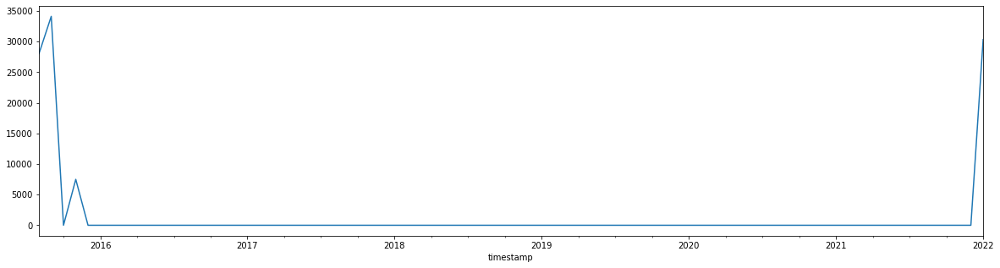

In [30]:
output = sqldf(" SELECT block_timestamp as timestamp, count(*) as count FROM transactions_df GROUP BY 1 ")
#output
output['timestamp'] = pd.to_datetime(output.timestamp)
agg = output.resample('M', on='timestamp').sum()
agg.plot(y='count', legend=False, figsize=(20, 5))
title='Ethereum Smart Contracts (monthly totals)',
plt.savefig('transactions_over_time.png', transparent=True)

## Price/Gas related query below:

#### Average Gas price per day

In [31]:
query = """
SELECT AVG(transactions.gas_price) AS avg_gas_price, DATE(blocks.timestamp) AS tx_date
FROM   transactions_df AS transactions JOIN blocks_df AS blocks ON transactions.block_number = blocks.number
GROUP BY tx_date ORDER BY tx_date """
output = sqldf(query)
output


,avg_gas_price,tx_date


#### Get  average price of Ethereum

### Contract related query:

#### Contract Creation over the time

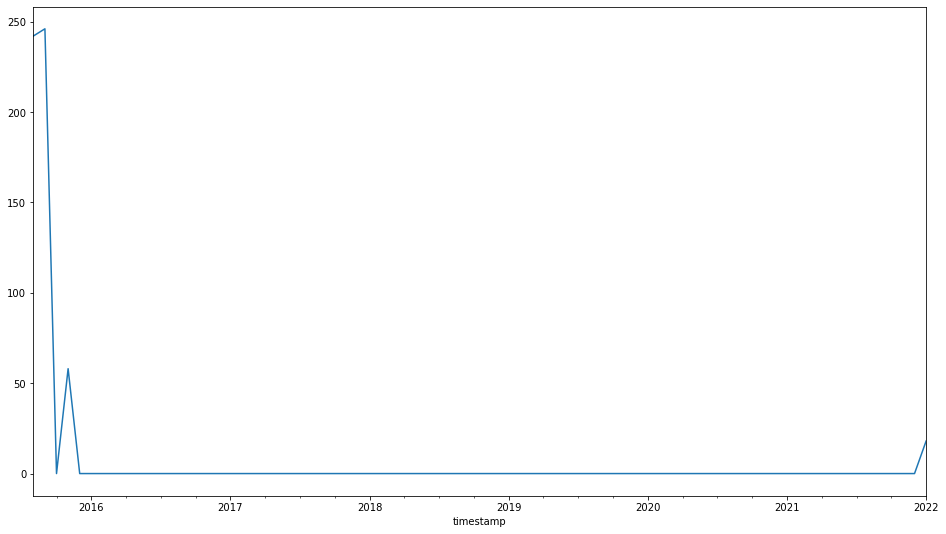

In [32]:
query = """
    SELECT block_timestamp as timestamp, count(*) as count FROM transactions_df WHERE to_address is null -- contract creation
    GROUP BY 1 ORDER BY 1 asc """

output = sqldf(query)
#output
output['timestamp'] = pd.to_datetime(output.timestamp)
agg = output.resample('M', on='timestamp').sum()

agg.plot(y='count', legend=False, figsize=(16, 9))
title='Ethereum Smart Contracts (monthly totals)',
plt.savefig('transactions_over_time.png', transparent=True)

### Account Activity query :

In [33]:
#transactions_df

#### Top 10 Account addresses have more than 5 times appeared (n-updates / activities)

In [34]:
query = """
SELECT address, SUM(n_updates) AS updates
FROM
(
  SELECT address, COUNT(*) AS n_updates
  FROM
  (
  SELECT DISTINCT from_address AS address, block_number AS block_number
  FROM transactions_df
  )
  GROUP BY address
)
WHERE
  n_updates >= 5 AND address IS NOT NULL
  GROUP BY address
  ORDER BY updates DESC
"""
output = sqldf(query).head(10)
output

,address,updates
0,0x1dcb8d1f0fcc8cbc8c2d76528e877f915e299fbe,4243
1,0x2a65aca4d5fc5b5c859090a6c34d164135398226,1586
2,0xd0aedab61b09d85fbbfaa0d3bd9797c1c13dd5af,1442
3,0x32be343b94f860124dc4fee278fdcbd38c102d88,1335
4,0x2910543af39aba0cd09dbb2d50200b3e800a63d2,1069
5,0x120a270bbc009644e35f0bb6ab13f95b8199c4ad,913
6,0x7c5080988c6d91d090c23d54740f856c69450b29,873
7,0x63a9975ba31b0b9626b34300f7f627147df1f526,777
8,0x3d98cda129757329c82edbc090234cfa77478dc1,645
9,0x42e6723a0c884e922240e56d7b618bec96f35800,564


# Machine Learning Models

### Preprocessing

In [35]:
transactions_df.isna().sum()

hash                               0
nonce                              0
transaction_index                  0
from_address                       0
to_address                       564
value                              0
gas                                0
gas_price                          0
input                              0
receipt_cumulative_gas_used        0
receipt_gas_used                   0
receipt_status                 69649
block_timestamp                    0
block_number                       0
block_hash                         0
max_fee_per_gas                79205
max_priority_fee_per_gas       79205
transaction_type               79189
receipt_effective_gas_price        0
receipt_contract_address       99436
receipt_root                   30351
dtype: int64

In [36]:
#transactions_df.dropna(axis=0, how='all' , inplace = True)
#transactions_df = transactions_df.dropna()


In [37]:
transactions_df_copy = pd.DataFrame()

In [38]:
#procesing the transaction
#copy from actual the transaction

transactions_df_copy['hash'] = transactions_df['hash']
transactions_df_copy['nonce'] = transactions_df['nonce']
transactions_df_copy['transaction_index'] = transactions_df['transaction_index']
transactions_df_copy['from_address'] = transactions_df['from_address']
transactions_df_copy['to_address'] = transactions_df['to_address']
transactions_df_copy['value'] = transactions_df['value']
transactions_df_copy['gas'] = transactions_df['gas']
transactions_df_copy['gas_price'] = transactions_df['gas_price']


In [39]:
transactions_df_copy.isna().sum()

hash                   0
nonce                  0
transaction_index      0
from_address           0
to_address           564
value                  0
gas                    0
gas_price              0
dtype: int64

In [40]:
transactions_df_copy = transactions_df_copy.dropna()

In [41]:
transactions_df_copy.columns

Index(['hash', 'nonce', 'transaction_index', 'from_address', 'to_address',
       'value', 'gas', 'gas_price'],
      dtype='object')

In [42]:
#transactions_df_copy.info
display(transactions_df_copy.dtypes)

hash                  object
nonce                  int64
transaction_index      int64
from_address          object
to_address            object
value                float64
gas                    int64
gas_price              int64
dtype: object

In [43]:
transactions_df_copy.shape

(99436, 8)

In [44]:
transactions_df_copy.describe()

,nonce,transaction_index,value,gas,gas_price
count,9.943600e+04,99436.000000,9.943600e+04,9.943600e+04,9.943600e+04
mean,4.270994e+05,47.956263,2.133066e+20,1.035136e+05,1.013752e+11
std,3.343018e+06,87.119145,3.949901e+21,2.472031e+05,6.088271e+11
min,0.000000e+00,0.000000,0.000000e+00,2.100000e+04,4.500000e+10
25%,1.200000e+01,0.000000,1.365413e+16,2.100000e+04,5.000000e+10
50%,2.010000e+02,4.000000,1.000000e+18,4.626750e+04,5.572794e+10
75%,1.398425e+04,60.000000,5.025997e+18,9.000000e+04,6.901135e+10
max,3.972195e+07,1136.000000,3.232034e+23,1.998036e+07,1.000000e+14


In [45]:
#transactions_df.dropna(axis=0, inplace=True)

In [46]:
# independent
X= transactions_df_copy[['from_address' , 'value' ,'gas', 'gas_price']] 

# dependent
y= transactions_df_copy[['to_address']] 

In [47]:
X.isna().sum()

from_address    0
value           0
gas             0
gas_price       0
dtype: int64

In [48]:

from sklearn import preprocessing 

le = preprocessing.LabelEncoder()

le.fit(transactions_df['from_address'].unique().tolist())
X['from_address'] = le.transform(X['from_address']);


le.fit(transactions_df['to_address'].unique().tolist())
y['to_address'] = le.transform(y['to_address'])

C:\Users\ASIFRA~1\AppData\Local\Temp/ipykernel_13540/3834772069.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X['from_address'] = le.transform(X['from_address']);
C:\Users\ASIFRA~1\AppData\Local\Temp/ipykernel_13540/3834772069.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['to_address'] = le.transform(y['to_address'])


In [49]:
X.isna().sum()

from_address    0
value           0
gas             0
gas_price       0
dtype: int64

In [50]:
X = X.reset_index()

In [51]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30 , random_state=2 )
X_train.shape , y_train.shape ,  X_test.shape , y_test.shape

((69605, 5), (69605, 1), (29831, 5), (29831, 1))

In [52]:
#X_train
#X_test
#y_train
y_test

,to_address
37532,8523
4418,12323
99388,14928
91556,9217
3693,9570
...,...
32616,2496
49283,4041
65599,4114
68095,4041


In [53]:
#y_train.fillna(X_train.mean(), inplace=True)

## Feature selection

#### Heatmap

In [54]:
corr_matrix = transactions_df_copy.corr()
print(corr_matrix)

                      nonce  transaction_index     value       gas  gas_price
nonce              1.000000           0.076270 -0.006882  0.056065  -0.004862
transaction_index  0.076270           1.000000 -0.028067  0.069673  -0.025569
value             -0.006882          -0.028067  1.000000 -0.013538   0.013885
gas                0.056065           0.069673 -0.013538  1.000000   0.011375
gas_price         -0.004862          -0.025569  0.013885  0.011375   1.000000


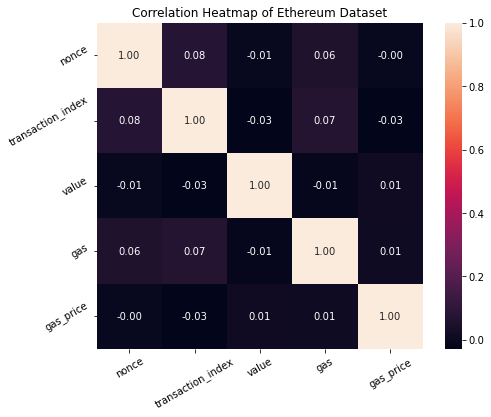

In [55]:
# Create correlation heatmap
plt.figure(figsize=(8,6))
plt.title('Correlation Heatmap of Ethereum Dataset')
a = sns.heatmap(corr_matrix, square=True, annot=True, fmt='.2f', linecolor='black')
a.set_xticklabels(a.get_xticklabels(), rotation=30)
a.set_yticklabels(a.get_yticklabels(), rotation=30)           
plt.show()    

# Cluster:

In [56]:
from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters=10, random_state=0) 

kmeans.fit(X)

KMeans(n_clusters=10, random_state=0)

In [57]:
kmeans.cluster_centers_

array([[4.98687546e+04, 1.06299894e+04, 2.65586122e+19, 1.04472674e+05,
        9.82990686e+10],
       [3.20611667e+04, 1.02486667e+04, 2.00503579e+23, 2.10000000e+04,
        7.97815813e+10],
       [5.05335263e+04, 9.74356579e+03, 4.98659368e+22, 4.53815789e+04,
        2.39208877e+11],
       [3.82556667e+04, 1.13730000e+04, 3.14227233e+23, 2.10000000e+04,
        1.00000000e+11],
       [4.81373636e+04, 8.72536364e+03, 1.50766995e+23, 2.36363636e+04,
        1.73851014e+11],
       [5.06151683e+04, 8.94896635e+03, 9.81734093e+21, 4.08282308e+04,
        4.46376787e+11],
       [4.95424167e+04, 8.82791667e+03, 8.64905343e+22, 3.09166667e+04,
        2.07736810e+11],
       [4.71013700e+04, 1.00167200e+04, 2.33759889e+22, 4.45700000e+04,
        4.35796821e+11],
       [5.65864472e+04, 8.39643208e+03, 3.15166470e+21, 4.02446292e+04,
        2.73617830e+11],
       [5.10634000e+04, 1.29280000e+04, 2.43806822e+23, 7.26000000e+04,
        6.49594941e+10]])

In [58]:
kmeans.labels_

array([0, 0, 0, ..., 0, 0, 0])

## Ethereum Transaction Graph 

In [59]:
transactions_df1  = pd.read_json("Dataset/transactions.json" , lines=True) #pd.read_json("/content/drive/MyDrive/Blockchain_project_dataset/transactions.json" , lines=True)

transactions_df = transactions_df1[0:5000]

In [60]:
A = list(transactions_df["from_address"].unique())
B = list(transactions_df["to_address"].unique())

In [61]:
node_list = set(A+B)  

In [62]:
G = nx.Graph()

In [63]:
for i in node_list:
    G.add_node(i)

In [64]:
#G.nodes()

In [65]:
#nx.draw_networkx(G)

In [66]:
#G.nodes

In [67]:
len(G.nodes)

5586

In [68]:
for i,j in transactions_df.iterrows():
    #print(j["from_address"])
    #break
    G.add_edges_from([(j["from_address"],j["to_address"])])

In [69]:
print(nx.info(G))

Graph with 5586 nodes and 4518 edges


In [70]:
Gdata = pd.DataFrame(data=list(G.edges()), columns=['Node 1', 'Node 2'])
Gdata.head()

,Node 1,Node 2
0,NaN,0xbb50ce87be3443ed137df1dfdbf2fb0ca8c0a9e0
1,NaN,0x9862d074e33003726fa05c74f0142995f33a3250
2,NaN,0xc041a45837259272b14259432af9912255f01fe3
3,0x773cd98926dd4268f00fa14515851e31502c79be,0xb5d85cbf7cb3ee0d56b3bb207d5fc4b82f43f511
4,0x61ed91d91b71061e9cd3ce4fc7dbd51a3a98f4dc,0xf411903cbc70a74d22900a5de66a2dda66507255


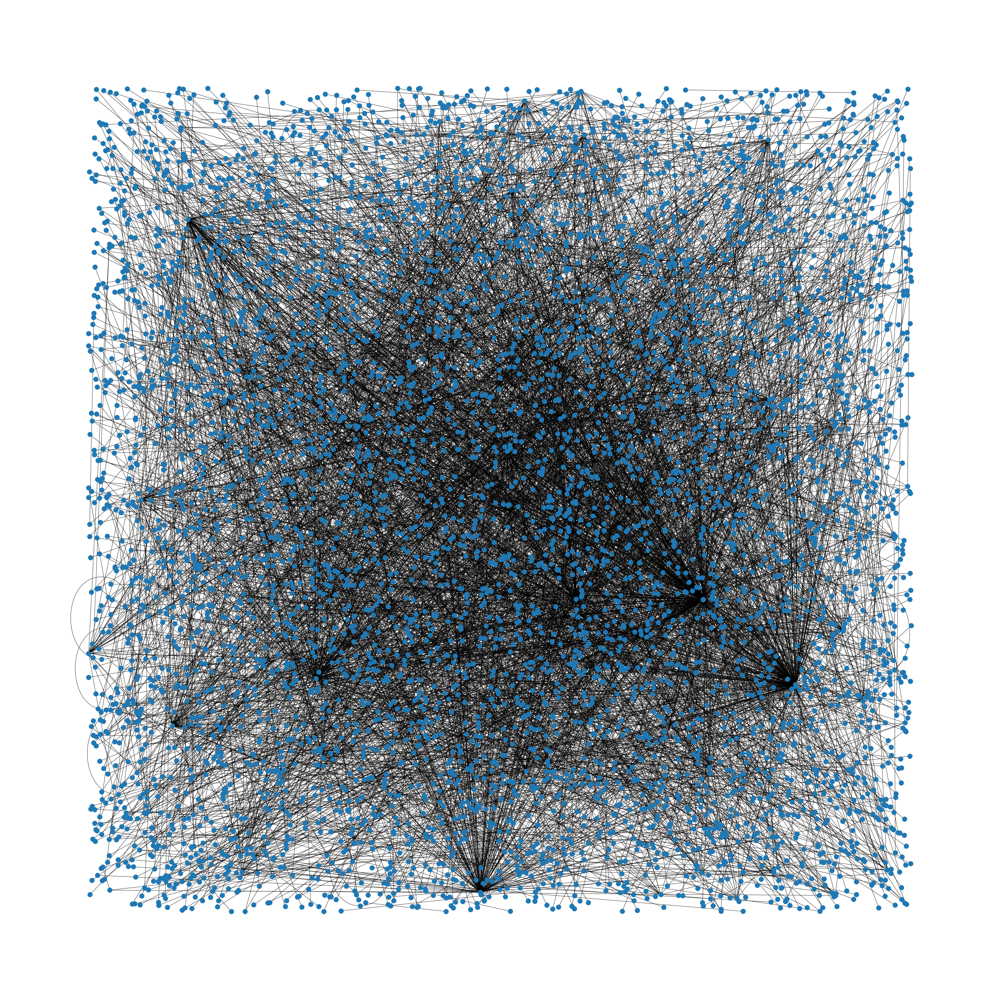

In [71]:
plt.figure(figsize=(50,50))
pos = nx.random_layout(G)
nx.draw_networkx(G, pos, with_labels=False)
 
plt.axis('off')
plt.tight_layout();

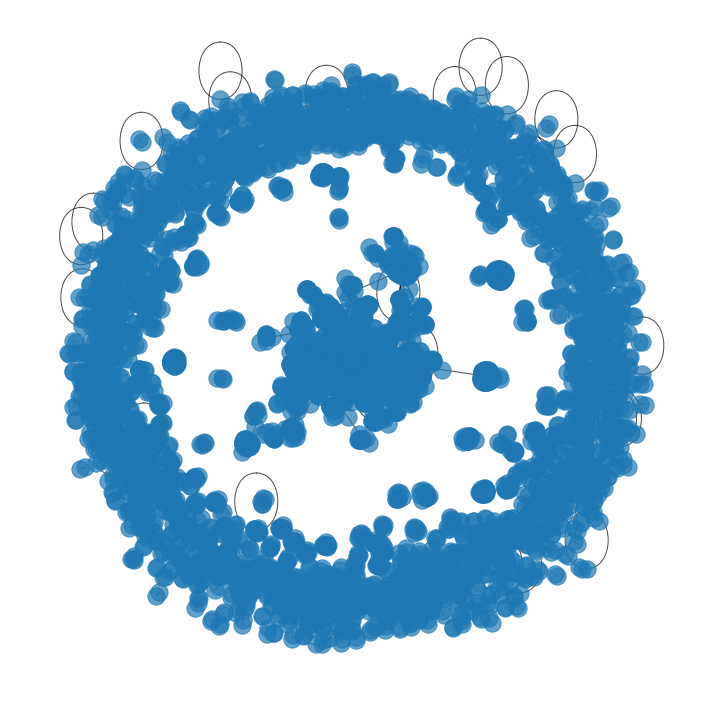

In [72]:
plt.figure(figsize=(10,10))
nx.draw_networkx(G, alpha=0.7, with_labels=False)
plt.axis('off')
plt.tight_layout();

### Adjacency Matrix

In [73]:
# adjcecy metrix
l = list(G.nodes())
 
# create adjacency matrix
adj_G = nx.to_numpy_matrix(G, nodelist = l)
 
print(str(adj_G.shape)+'\n')
adj_G

(5586, 5586)



matrix([[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]])

### Find the non-existing-edges

In [74]:
from tqdm import tqdm
# get all node pairs which don't have an edge
non_existing_edges = []
 
# traverse adjacency matrix
offset = 0
for i in tqdm(range(adj_G.shape[0])):
    for j in range(offset,adj_G.shape[1]):
        if i != j:
            if adj_G[i,j] == 0:
                   non_existing_edges.extend([(l[i],l[j])])
 
    offset = offset + 1

100%|██████████| 5586/5586 [00:23<00:00, 241.69it/s] 


### randomly select 500 for balance the data 

In [75]:
import random

nodes_500 = (random.sample(non_existing_edges, k=500))

In [76]:
len(non_existing_edges)

15594417

In [77]:
non_existing_edges = [(i[0],i[1]) for i in tqdm(nodes_500) if nx.has_path(G, i[0], i[1])]

100%|██████████| 500/500 [00:00<00:00, 11393.97it/s]


In [78]:
non_existing_edges[:5]

[('0xd3531aa9bc313b28a1950f9f67f83ba0bc1710b6',
  '0x628f06779634ec4adb9b14e3d5b6b25e0845c874'),
 ('0xd9e1ce17f2641f24ae83637ab66a2cca9c378b9f',
  '0x801942e00c1601c4538373a8b860abefad1e43f7'),
 ('0xa90c42f75c1dcbf19408df6435cee0e1146cf257',
  '0x45fbe250880aa5d0db4d25b0197be2f92f24c95c'),
 ('0xfea9c81ad866569525876495f422c41080e6a3bd',
  '0x59cea9c7245276c06062d2fe3f79ee21fc70b53c'),
 ('0x87e20a71d8b26c528603f71e1bc756bd31c211d3',
  '0x4ff72e96ad7d800d9dbb9186ff178b270f46cc20')]

In [79]:
df1 = pd.DataFrame(data = non_existing_edges, columns =['Node 1', 'Node 2'])
 
# create a column 'Connection' with default 0 (no-connection)
df1['Connection'] = 0
 
df1.head()

,Node 1,Node 2,Connection
0,0xd3531aa9bc313b28a1950f9f67f83ba0bc1710b6,0x628f06779634ec4adb9b14e3d5b6b25e0845c874,0
1,0xd9e1ce17f2641f24ae83637ab66a2cca9c378b9f,0x801942e00c1601c4538373a8b860abefad1e43f7,0
2,0xa90c42f75c1dcbf19408df6435cee0e1146cf257,0x45fbe250880aa5d0db4d25b0197be2f92f24c95c,0
3,0xfea9c81ad866569525876495f422c41080e6a3bd,0x59cea9c7245276c06062d2fe3f79ee21fc70b53c,0
4,0x87e20a71d8b26c528603f71e1bc756bd31c211d3,0x4ff72e96ad7d800d9dbb9186ff178b270f46cc20,0


In [80]:
# Create a list of all indices of the node pairs in the Gdata dataframe,
# which when removed won’t change the structure of our graph
 
# create a copy
Gdata_temp = Gdata.copy()
 
# for storing removable edges
removable_edges_indices = []
 
# number of connected components and nodes of G
ncc = nx.number_connected_components(G)
number_of_nodes = len(G.nodes)
 
# for each node pair we will be removing a node pair and creating a new graph,
# and check if the number of connected components and the number of nodes are the same as the original graph
for i in tqdm(Gdata.index.values):
  
      # remove a node pair and build a new graph
    G1 = nx.from_pandas_edgelist(Gdata_temp.drop(index= i), "Node 1", "Node 2",
                                create_using=nx.Graph())
  
      # If the number of connected components remain same as the original
      # graph we won't remove the edge
    if (nx.number_connected_components(G1) == ncc) and (len(G1.nodes) == number_of_nodes):
        removable_edges_indices.append(i)
 
       # drop the edge, so that for the next iteration the next G1
       # is created without this edge
        Gdata_temp = Gdata_temp.drop(index = i)

100%|██████████| 4518/4518 [02:09<00:00, 34.80it/s]


In [81]:
# get node pairs in Gdata dataframe with indices in removable_edges_indices
df2 = Gdata.loc[removable_edges_indices]
 
# create a column 'Connection' and assign default value of 1 (connected nodes)
df2['Connection'] = 1
 
df2.head()

,Node 1,Node 2,Connection
77,0x7a250d5630b4cf539739df2c5dacb4c659f2488d,0x0afa0e7ce6d6a5526a0fb08ca08f42515f75385d,1
147,0x3d9f0454a7d13e4abf976094426b738bb95413d9,0xc02aaa39b223fe8d0a0e5c4f27ead9083c756cc2,1
227,0x52e414d86d7697d60f3c9d88be5b4186a064855a,0x8b3192f5eebd8579568a2ed41e6feb402f93f73f,1
373,0x318cea50deaa14d530265b1681abf4ec745cdb77,0x881d40237659c251811cec9c364ef91dc08d300c,1
427,0x34aa239e8ded7319b62446d95fb7aa9ff5894a19,0xd9e1ce17f2641f24ae83637ab66a2cca9c378b9f,1


In [82]:
df1 = df1.append(df2[['Node 1', 'Node 2', 'Connection']], ignore_index=True)

In [83]:
df1.head()

,Node 1,Node 2,Connection
0,0xd3531aa9bc313b28a1950f9f67f83ba0bc1710b6,0x628f06779634ec4adb9b14e3d5b6b25e0845c874,0
1,0xd9e1ce17f2641f24ae83637ab66a2cca9c378b9f,0x801942e00c1601c4538373a8b860abefad1e43f7,0
2,0xa90c42f75c1dcbf19408df6435cee0e1146cf257,0x45fbe250880aa5d0db4d25b0197be2f92f24c95c,0
3,0xfea9c81ad866569525876495f422c41080e6a3bd,0x59cea9c7245276c06062d2fe3f79ee21fc70b53c,0
4,0x87e20a71d8b26c528603f71e1bc756bd31c211d3,0x4ff72e96ad7d800d9dbb9186ff178b270f46cc20,0


In [84]:
df1['Connection'].value_counts()

0    84
1    79
Name: Connection, dtype: int64

In [85]:
df3 = Gdata.drop(index=df2.index.values)

In [86]:
df3.head()

,Node 1,Node 2
0,NaN,0xbb50ce87be3443ed137df1dfdbf2fb0ca8c0a9e0
1,NaN,0x9862d074e33003726fa05c74f0142995f33a3250
2,NaN,0xc041a45837259272b14259432af9912255f01fe3
3,0x773cd98926dd4268f00fa14515851e31502c79be,0xb5d85cbf7cb3ee0d56b3bb207d5fc4b82f43f511
4,0x61ed91d91b71061e9cd3ce4fc7dbd51a3a98f4dc,0xf411903cbc70a74d22900a5de66a2dda66507255


In [87]:
G_new = nx.from_pandas_edgelist(df3, "Node 1", "Node 2", create_using=nx.Graph())

print(nx.info(G_new))

Graph with 5586 nodes and 4439 edges


### Node2Vac

In [88]:
from node2vec import Node2Vec
 
# Generating walks
node2vec = Node2Vec(G_new, dimensions=100, walk_length=16, num_walks=50)
 
# training the node2vec model
n2v_model = node2vec.fit(window=7, min_count=1)

Computing transition probabilities:   0%|          | 0/5586 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████| 50/50 [00:34<00:00,  1.43it/s]


In [89]:
n2v_model

In [90]:
# see the embedding
n2v_model.wv.get_vector('0xe48c1d60e84267e420d0b5049a5c54fe3a3d0102')

array([ 0.84782207,  0.3749032 ,  0.28882873,  0.69363946,  0.5688193 ,
       -0.2737789 ,  0.23714985, -0.04349144,  0.7422084 ,  0.7024348 ,
        0.28244925, -0.829549  , -0.42770436, -0.5210049 , -0.5105307 ,
        0.18069376,  0.2769694 , -0.65140384, -0.04123414, -0.3957839 ,
        0.92131436, -0.1504758 ,  1.4544241 , -0.03955265,  0.1245165 ,
       -0.440424  , -0.6961717 , -0.05736629, -0.14869043, -0.08947645,
        1.1844288 ,  0.0497223 , -0.19164506, -0.62076145, -0.6786119 ,
        0.47184494,  0.0537364 ,  0.23180704, -0.4198545 , -0.47499493,
        0.3852316 , -0.12663427, -0.02291225,  0.33453095, -0.21665502,
       -0.42494315,  0.26955768, -0.29663497,  0.16338725,  0.8875581 ,
        0.4081143 ,  0.16913372,  0.02846504,  0.24670227, -0.31783697,
       -0.16615227, -0.29436788, -0.2948026 ,  0.5668495 , -0.84097403,
       -0.3148901 ,  0.92998695,  0.72293526,  0.10489879, -0.6496145 ,
        0.14459708, -0.49835497,  0.41200614, -0.15125445, -0.32

In [91]:
#find the most similiar  
n2v_model.wv.most_similar('0xe48c1d60e84267e420d0b5049a5c54fe3a3d0102')

[('0x82d51e9a7a1fe2c1de4f0032c38454ebdffb69da', 0.9989060759544373),
 ('0xeed560b1b0172baa6e137c27aa0a643326f360d1', 0.9985039234161377),
 ('0xb65afc61db4d0052c055f36e24cb145459c88ed8', 0.6066025495529175),
 ('0x68b17e632772a8cb9b35cc3fa7e41a6f0385f3d7', 0.6005221605300903),
 ('0x9caf33b0dc53a5427a5475505cca7a634ef243a5', 0.5955797433853149),
 ('0xf4b89b1385f19b8c0ab47066f9020b02d6c8f613', 0.5750861763954163),
 ('0x7bcd790d1282622da859625f3786be9f33042d50', 0.5694173574447632),
 ('0xb4ab0de6581fbd3a02cf8f9f265138691c3a7d5d', 0.5682766437530518),
 ('0x28b00ac3190a89d10db93c44ee8fb0b0628f0d03', 0.5668542981147766),
 ('0x3fe65692bfcd0e6cf84cb1e7d24108e434a7587e', 0.5629732608795166)]

In [92]:
# Retrieve node embeddings
node_ids = n2v_model.wv  # list of node IDs
node_embeddings = n2v_model.wv.vectors


print(node_ids[0])
print(node_embeddings[0])

[ 0.21757174  0.52130675  0.18712123  0.20120424 -0.14196075 -0.93360806
  0.49338102  0.73082626 -0.11063167  0.18755475  0.42458263 -0.39459285
 -0.11061289  0.30743575 -0.08438932 -0.2957781   0.34397703 -0.35580772
 -0.16415063 -0.4588466   0.16849044  0.27267882  0.6888806   0.05857659
  0.6127225  -0.2984334  -0.48953003 -0.09663399  0.15028554 -0.2581272
 -0.6499468  -0.05817194  0.47769883 -0.6594492   0.12674238  0.02193717
  0.20941244 -0.25336218 -0.11352434 -0.11210367 -0.04810758 -0.28602958
 -0.20270249  0.28136098  0.14854962 -0.24300371 -0.56803215  0.5731409
  0.17715919  0.20227385 -0.31320783  0.3241338  -0.23105034  0.10035337
  0.23682277  0.06278536  0.19459142 -0.17785062 -0.14234763  0.03442022
  0.12468083  0.14818677 -0.62442446 -0.04999921 -0.33330315  0.01225988
 -0.07703879 -0.021192   -0.14848064  0.24178064 -0.01247675  0.5270206
  0.539441   -0.60398954  0.29088315  0.19307363 -0.05278023 -0.17258531
  0.02894137 -0.34465396  0.188767    0.25179586  0.53

In [93]:
edge_features = [(n2v_model.wv[str(i)]+n2v_model.wv[str(j)]) for i,j in zip(df1['Node 1'], df1['Node 2'])]

In [94]:
(edge_features)

[array([ 0.19702083,  0.7690259 , -0.20648214, -0.19405226, -0.6594147 ,
        -1.8148466 ,  1.2111245 ,  1.3588285 , -0.13316645, -0.13165389,
         0.5424255 , -0.49038267, -0.51885766,  0.11684273, -0.7209679 ,
        -0.61874765,  0.6064546 , -1.2096405 , -0.16501918, -0.7608185 ,
         0.05673115,  0.4768666 ,  1.4413688 ,  0.4696818 ,  0.64571804,
        -0.3402822 , -0.5692723 , -0.25255173,  0.36745733, -0.21480553,
        -0.5291775 , -0.42270797,  0.6255239 , -1.6936337 ,  0.23323263,
         0.53021234,  0.9607047 , -0.05864597, -0.17676744, -0.63490224,
         0.50379926, -0.84420115, -0.36049846,  0.18807106, -0.04321574,
        -0.6771695 , -1.1439152 ,  0.9608265 , -0.04270376,  0.7874805 ,
        -0.2863812 ,  0.16005687, -0.3442487 ,  0.3724804 ,  0.03614564,
        -0.28073567,  0.54139405, -0.3506523 , -0.36254352, -0.63580036,
         0.5296401 ,  0.0882007 , -0.55232084, -0.49499726, -0.7074732 ,
         0.30224925, -0.10422567,  0.02140258, -0.5

In [95]:
X = np.array(edge_features) 

In [96]:
X

array([[ 0.19702083,  0.7690259 , -0.20648214, ..., -0.39853808,
         0.15933764, -0.4604162 ],
       [-0.16746415,  0.17033231, -0.6268211 , ...,  0.32978058,
        -0.3286146 , -0.5854869 ],
       [-0.47681916,  1.2224479 , -1.131064  , ..., -0.01382513,
        -0.23761939, -0.43476188],
       ...,
       [-0.10474567,  0.0125088 , -1.542317  , ...,  0.40719083,
        -0.42162517, -0.12701751],
       [ 0.69033897, -0.10883366, -0.14969556, ...,  0.40125522,
         0.7840107 ,  0.50020003],
       [ 0.14495915,  0.77395463, -0.5160907 , ..., -0.58580625,
         0.10677215, -1.1549608 ]], dtype=float32)

In [97]:
y = df1['Connection']

In [98]:
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state = 0)

### Logistic Regression

In [99]:
#logistic reggeration

lr = LogisticRegression(class_weight="balanced")

lr.fit(X_train, y_train)

LogisticRegression(class_weight='balanced')

In [100]:
predictions = lr.predict_proba(X_test)

In [101]:
len(X_train),len(y_train), len(X_test), len(y_test)

(122, 122, 41, 41)

In [102]:
#for sigle node
#predictions = lr.predict_proba(X_test[:,1])
#predictions

y_test

160    1
149    1
73     0
7      0
100    1
54     0
125    1
44     0
26     0
90     1
136    1
94     1
131    1
80     0
62     0
119    1
37     0
154    1
101    1
142    1
51     0
138    1
33     0
45     0
146    1
8      0
150    1
89     1
92     1
124    1
63     0
55     0
93     1
24     0
56     0
118    1
19     0
66     0
134    1
16     0
60     0
Name: Connection, dtype: int64

In [103]:
roc_auc_score(y_test, predictions[:,1])

0.8

### Random Forest Classifier

In [104]:
#classifier
clf1 = RandomForestClassifier()
 
# parameters
param = {'n_estimators' : [10,50,100], 'max_depth' : [5,10,15]}
 
# model
grid_clf_acc1 = GridSearchCV(clf1, param_grid = param)
 
# train the model
grid_clf_acc1.fit(X_train, y_train)
 
print('Grid best parameter (max. accuracy): ', grid_clf_acc1.best_params_)
print('Grid best score (accuracy): ', grid_clf_acc1.best_score_)
 
# alternative metric to optimize over grid parameters: AUC
grid_clf_auc1 = GridSearchCV(clf1, param_grid = param, scoring = 'roc_auc')
grid_clf_auc1.fit(X_train, y_train)
predict_proba = grid_clf_auc1.predict_proba(X_test)[:,1]
 
print('Test set AUC: ', roc_auc_score(y_test, predict_proba))
print('Grid best parameter (max. AUC): ', grid_clf_auc1.best_params_)
print('Grid best score (AUC): ', grid_clf_auc1.best_score_)

Grid best parameter (max. accuracy):  {'max_depth': 10, 'n_estimators': 50}
Grid best score (accuracy):  0.787
Test set AUC:  0.8238095238095238
Grid best parameter (max. AUC):  {'max_depth': 5, 'n_estimators': 50}
Grid best score (AUC):  0.8337995337995338


### Gradient Boosting Classifier

In [105]:
# classifier
clf2 = GradientBoostingClassifier()
 
# parameters
param = {'learning_rate' : [.05,.1]}
 
# model
grid_clf_acc2 = GridSearchCV(clf2, param_grid = param)
 
# train the model
grid_clf_acc2.fit(X_train, y_train)
 
print('Grid best parameter (max. accuracy): ', grid_clf_acc2.best_params_)
print('Grid best score (accuracy): ', grid_clf_acc2.best_score_)
 
# alternative metric to optimize over grid parameters: AUC
grid_clf_auc2 = GridSearchCV(clf2, param_grid = param, scoring = 'roc_auc')
grid_clf_auc2.fit(X_train, y_train)
predict_proba = grid_clf_auc2.predict_proba(X_test)[:,1]
 
print('Test set AUC: ', roc_auc_score(y_test, predict_proba))
print('Grid best parameter (max. AUC): ', grid_clf_auc2.best_params_)
print('Grid best score (AUC): ', grid_clf_auc2.best_score_)

Grid best parameter (max. accuracy):  {'learning_rate': 0.1}
Grid best score (accuracy):  0.6966666666666667
Test set AUC:  0.8357142857142856
Grid best parameter (max. AUC):  {'learning_rate': 0.05}
Grid best score (AUC):  0.8032536907536908


### Cluster in Graph

In [106]:
transactions_df1  = pd.read_json("Dataset/transactions.json" , lines=True) #pd.read_json("/content/drive/MyDrive/Blockchain_project_dataset/transactions.json" , lines=True)

transactions_df = transactions_df1[0:100000]

In [107]:
A = list(transactions_df["from_address"].unique())
B = list(transactions_df["to_address"].unique())

In [108]:
node_list = set(A+B)  

In [109]:
G = nx.Graph()

In [110]:
for i in node_list:
    G.add_node(i)

In [111]:
#G.nodes()

In [112]:
#nx.draw_networkx(G)

In [113]:
#G.nodes

In [114]:
len(G.nodes)

33648

In [115]:
print(nx.clustering(G))

{nan: 0, '0x773cd98926dd4268f00fa14515851e31502c79be': 0, '0xb44111484e18c16c38e54bb323d7ac3736a013d2': 0, '0xaa9485eba854aba86bfdd64c8f4f08badd0f31c3': 0, '0x022ae2476193d48287ada036f6e91de3784beee9': 0, '0x79dd22579112d8a5f7347c5ed7e609e60da713c5': 0, '0x3b48af5d68d7ccf6f9fb822c4b377b04491f5af3': 0, '0x1274e5e3a3882ced79e05e8cfb33bdda5e2d911b': 0, '0x145e0f7a673107fd6be941b57410c3c4e8f2f456': 0, '0xee244d49a9d006c96a53b7d269df63cc06bc2312': 0, '0xc5ccd0caca6210bd71a03bd1940b97355bb8649f': 0, '0x4ef5e475724b7c945a4bdbb1be68d76103ba9013': 0, '0x4f5e090383cf2a3122ef53e88272956630cea0e6': 0, '0xf95840c8ce0364fa85b883d88c8c0b03e137f6c9': 0, '0x4193122032b38236825bba166f42e54fc3f4a1ee': 0, '0x6a5d1449263c0ddde0a30bf48714ff97503597dc': 0, '0xc40ebc923f794eed9039b84471e77821cac1fafe': 0, '0x4a29df8a7967b36664f256f18dacf2e58e9f1e7e': 0, '0xc9f5d1f9e3435b723a19ba07a51863675d896765': 0, '0x833db9bc424dbda6657780d1392ef714f503106c': 0, '0xe9d85a74de935df91259ca7835a137e061b34ef1': 0, '0x54cec426

In [116]:
# This returns clustering value of specified node
print(nx.clustering(G, '0xdb84d8840e3df6d61ae9239639277f7050d79435'))

0
